<a href="https://colab.research.google.com/github/MuthomiTed/carsharing_Autolib-/blob/master/DS_Core_Independent_Project_Week_3_Muthomi_Ted.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### CORE

# INDEPENDENT PROJECT

## 1. Defining the Question

### a) Specifying the Data Analytic Question

> Predicting if the cars hired throughout weekends are returned during the weekends from Paris Autolib Carsharing company between January 2018 & June 2018 . 

### b) Defining the Metric for Success

>Plot appropriate univariate and bivariate summaries recording our observations.

>Implement the solution by performing hypothesis testing.

### c) Understanding the context 

> As a Data Scientist for the Autolib electric car-sharing service company we investigate a claim about the blue cars from the provided Autolib dataset.

> We need to identify some areas and periods of interest via sampling stating the reason to the choice of method, then perform hypothesis testing with regards to the claim. 

### d) Recording the Experimental Design

> True experimental Research design

### e) Data Relevance

> The provided dataset is a daily aggregation, by date and postal code, of the number of events on the Autolib network (car-sharing and recharging).

## 2. Reading the Data

### Importing Libraries 

#### a. Basic Python Libraries

In [10]:
# Importing os
import os


# Importing Numpy
import numpy as np


# Importing Pandas
import pandas as pd


# Importing Seaborn
import seaborn as sns


# Importing researchpy
!pip install researchpy
import researchpy as rp


# Importing scipy from stats
from scipy import stats


# Importing Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Importing ttest_1samp from scipy.stats
from scipy.stats import ttest_ind


# Importing ttest_1samp from scipy.stats
from scipy.stats import ttest_1samp



from IPython.display import display


# Importing warnings
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)



#### b. Machine Learning Libraries

In [11]:

from sklearn.linear_model import LinearRegression
from sklearn import model_selection
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.utils import resample
from sklearn import svm
from sklearn.datasets import samples_generator
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.pipeline import Pipeline
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


### Importing Data

In [0]:
# Loading the Data from the source i.e. csv
# ---

df = pd.read_csv('http://bit.ly/DSCoreAutolibDataset')

In [0]:
# Loading the columns explanation data

variable_definitions = pd.read_excel('columns_explanation.xlsx')

## 3. Checking the Data

In [8]:
# Previewing column descriptions

variable_definitions

,Column name,explanation
0,Postal code,postal code of the area (in Paris)
1,date,date of the row aggregation
2,n_daily_data_points,number of daily data poinst that were availabl...
3,dayOfWeek,identifier of weekday (0: Monday -> 6: Sunday)
4,day_type,weekday or weekend
5,BlueCars_taken_sum,Number of bluecars taken that date in that area
6,BlueCars_returned_sum,Number of bluecars returned that date in that ...
7,Utilib_taken_sum,Number of Utilib taken that date in that area
8,Utilib_returned_sum,Number of Utilib returned that date in that area
9,Utilib_14_taken_sum,Number of Utilib 1.4 taken that date in that area


In [0]:
# Determining the no. of records in our dataset
#

print('The  dataset has ', df.shape[1], ' columns and ', df.shape[0], ' rows!')

The  dataset has  13  columns and  16085  rows!


In [4]:
# Previewing the top of our dataset
#

df.head(3)

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
0,75001,1/1/2018,1440,0,weekday,110,103,3,2,10,9,22,20
1,75001,1/2/2018,1438,1,weekday,98,94,1,1,8,8,23,22
2,75001,1/3/2018,1439,2,weekday,138,139,0,0,2,2,27,27


In [0]:
# Previewing the bottom of our dataset
# 

df.tail(3)

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
16082,95880,6/17/2018,1440,6,weekend,33,35,1,1,0,0,0,0
16083,95880,6/18/2018,1440,0,weekday,11,14,3,5,2,2,0,0
16084,95880,6/19/2018,1370,1,weekday,2,2,2,1,0,0,0,0


In [0]:
# Checking whether each column has an appropriate datatype
#

df.dtypes

Postal code                int64
date                      object
n_daily_data_points        int64
dayOfWeek                  int64
day_type                  object
BlueCars_taken_sum         int64
BlueCars_returned_sum      int64
Utilib_taken_sum           int64
Utilib_returned_sum        int64
Utilib_14_taken_sum        int64
Utilib_14_returned_sum     int64
Slots_freed_sum            int64
Slots_taken_sum            int64
dtype: object

In [0]:
# Checking unique values and number of rows asigned for each column in the dataset

for i in df.columns:
  
  print('\n')
  
  print(df[i].value_counts())




94130    156
92310    156
78140    156
94700    156
95100    156
75006    156
75014    156
92150    156
92190    156
92230    156
92270    156
92350    156
94340    156
93110    156
93230    156
93310    156
93350    156
75007    156
75015    156
75019    156
94150    156
94450    156
94500    156
94300    156
75016    156
92300    156
78150    156
75004    156
75012    156
75020    156
        ... 
93360    156
92120    156
92160    156
92200    156
92240    156
92320    156
92400    156
93600    156
92800    156
92600    156
94230    156
93400    156
75001    156
75017    156
75009    156
92110    155
94410    155
75116    155
91400    155
93300    155
92420    155
92390    155
94100    155
92360    153
93440    151
93150    151
93370    149
92340    147
93200    126
93390     84
Name: Postal code, Length: 104, dtype: int64


6/1/2018     104
6/4/2018     104
6/3/2018     104
5/24/2018    104
2/28/2018    104
4/30/2018    104
2/1/2018     104
5/6/2018     104
1/25/2018    104
6/6/2

In [0]:
# checking the profile of our dataset

import pandas_profiling

pandas_profiling.ProfileReport(df)

Number of variables,13
Number of observations,16085
Total Missing (%),0.0%
Total size in memory,1.6 MiB
Average record size in memory,104.0 B
Numeric,5
Categorical,2
Boolean,0
Date,0
Text (Unique),0
Rejected,6


## 4. Tidying the Dataset

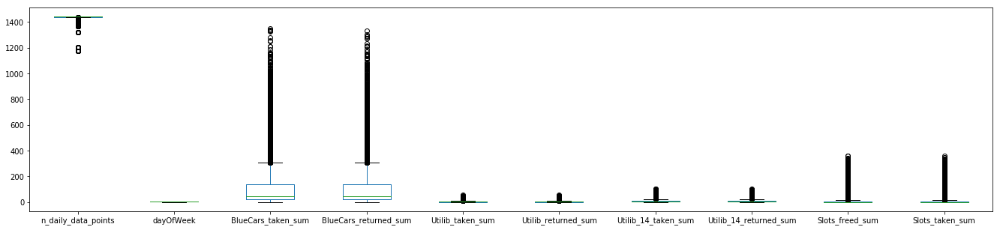

In [0]:
# Checking for Outliers
#
cols = df[['n_daily_data_points', 'dayOfWeek', 
       'BlueCars_taken_sum', 'BlueCars_returned_sum', 'Utilib_taken_sum',
       'Utilib_returned_sum', 'Utilib_14_taken_sum', 'Utilib_14_returned_sum',
       'Slots_freed_sum', 'Slots_taken_sum']]

cols.plot.box(figsize=(23,5))

plt.show()

In [0]:
# Checking for Anomalies
#

df.describe()

,Postal code,n_daily_data_points,dayOfWeek,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
count,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000
mean,88791.293876,1431.330619,2.969599,125.926951,125.912714,3.698290,3.699099,8.600560,8.599192,22.629033,22.629282
std,7647.342000,33.212050,2.008378,185.426579,185.501535,5.815058,5.824634,12.870098,12.868993,52.120263,52.146030
min,75001.000000,1174.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,91330.000000,1439.000000,1.000000,20.000000,20.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,92340.000000,1440.000000,3.000000,46.000000,46.000000,1.000000,1.000000,3.000000,3.000000,0.000000,0.000000
75%,93400.000000,1440.000000,5.000000,135.000000,135.000000,4.000000,4.000000,10.000000,10.000000,5.000000,5.000000
max,95880.000000,1440.000000,6.000000,1352.000000,1332.000000,54.000000,58.000000,100.000000,101.000000,360.000000,359.000000


In [0]:
# Identifying existence of missing data in the dataset

df.isnull().any()

Postal code               False
date                      False
n_daily_data_points       False
dayOfWeek                 False
day_type                  False
BlueCars_taken_sum        False
BlueCars_returned_sum     False
Utilib_taken_sum          False
Utilib_returned_sum       False
Utilib_14_taken_sum       False
Utilib_14_returned_sum    False
Slots_freed_sum           False
Slots_taken_sum           False
dtype: bool

In [0]:
# Renaming columns to interpretable column names

df.columns = ['Postal code', 'date', 'daily_points', 'dayOfWeek', 'day_type',
       'BlueCars_taken', 'BlueCars_returned', 'Utilib_taken',
       'Utilib_returned', 'Utilib_14_taken', 'Utilib_14_returned',
       'Slots_freed', 'Slots_taken']

In [0]:
# Changing column names to lower case

df.columns = df.columns.str.lower()

In [0]:
# Eliminating spaces between column names

df.columns  = df.columns.str.replace(' ', '_')

In [0]:
# Reviewing clean column names

df.columns

Index(['postal_code', 'date', 'daily_points', 'dayofweek', 'day_type',
       'bluecars_taken', 'bluecars_returned', 'utilib_taken',
       'utilib_returned', 'utilib_14_taken', 'utilib_14_returned',
       'slots_freed', 'slots_taken'],
      dtype='object')

In [0]:
# Dropping unnecessary columns

df.drop(['day_type'],axis = 1, inplace = True)

In [0]:
# Previewing clean dataframe

df.head(4)

,postal_code,date,daily_points,dayofweek,bluecars_taken,bluecars_returned,utilib_taken,utilib_returned,utilib_14_taken,utilib_14_returned,slots_freed,slots_taken
0,75001,2018-01-01,1440,0,110,103,3,2,10,9,22,20
1,75001,2018-01-02,1438,1,98,94,1,1,8,8,23,22
2,75001,2018-01-03,1439,2,138,139,0,0,2,2,27,27
3,75001,2018-01-04,1320,3,104,104,2,2,9,8,25,21


In [0]:
# Saving clean dataframe to a csv file

df.to_csv('autolib.csv')



## 5. Exploratory Analysis

In [0]:
# Importing date & time libraries

import datetime as dt

from datetime import timedelta



In [13]:
# Importing csv with date column as index for timewise analysis

df = pd.read_csv('autolib.csv', parse_dates = ['date'],index_col = 'date')

# Dropping former index column:
df.drop('Unnamed: 0',axis =1,inplace = True)

# Previewing data:
df.head(3)

,postal_code,daily_points,dayofweek,bluecars_taken,bluecars_returned,utilib_taken,utilib_returned,utilib_14_taken,utilib_14_returned,slots_freed,slots_taken
date,,,,,,,,,,,
2018-01-01,75001,1440,0,110,103,3,2,10,9,22,20
2018-01-02,75001,1438,1,98,94,1,1,8,8,23,22
2018-01-03,75001,1439,2,138,139,0,0,2,2,27,27


### a. Univariate Analysis

In [15]:
# Importing plotly to visualize interactive graphs
  
!pip install plotly 

# Plotly requires one to have a plotly account: Below I load my credentials 

!python -c "import plotly; plotly.tools.set_credentials_file(username='TEDM', api_key='NCGT27xF3iHaUQizd9Uc')"

In [0]:
# Importing plotly libraries

import plotly.plotly as py

import plotly.graph_objs as go

from plotly.graph_objs import Scatter

In [0]:
# The function below allows plotly to be computed in Google Collab notebooks

def plotly():
  
  import IPython
  
  from plotly.offline import init_notebook_mode
  
  display(IPython.core.display.HTML('''

        <script src="/static/components/requirejs/require.js"></script>

  '''))
  
  init_notebook_mode(connected=False)

In [0]:
# Relationship between individual days of the week and Bluecars returned

plotly()

df['dayofweek'] = df.dayofweek.astype('category')

df['dayofweek'] = df.dayofweek.map({0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'})

trace = go.Bar(
   
    x = df['dayofweek'],
    
    y = df['bluecars_returned'],
    
    name = 'Day of week vs Bluecar Return'
    
)

data = [trace]

layout = go.Layout(
    
    title = 'Number of Bluecars returned on each day of the week'
)

fig = go.Figure(data = data, layout = layout)

py.iplot(fig, validate =  False)

-OBSERVATION: 
> 1. The weekend commencing from Friday had the highest number of Bluecar returns 
> 2. The number of bluecar returns rarely differed during the weekdays 

In [33]:
plotly()

df['dayofweek'] = df.dayofweek.astype('category')

x = df.groupby('dayofweek')['bluecars_taken'].sum()

labels = 'Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'

title = 'Number of Bluecars hired on each day of the week'

fig = go.Figure(data=[go.Pie(labels=labels, values=x,title = title )])


py.iplot(fig)


-OBSERVATION:   
>               1. Distribution of hiring and returning bluecars is similar across weekdays and weekends
>               2. The weekend commencing from Friday had the highest number of Bluecar hires
>               3. The number of bluecar hires rarely differed during the weekdays 

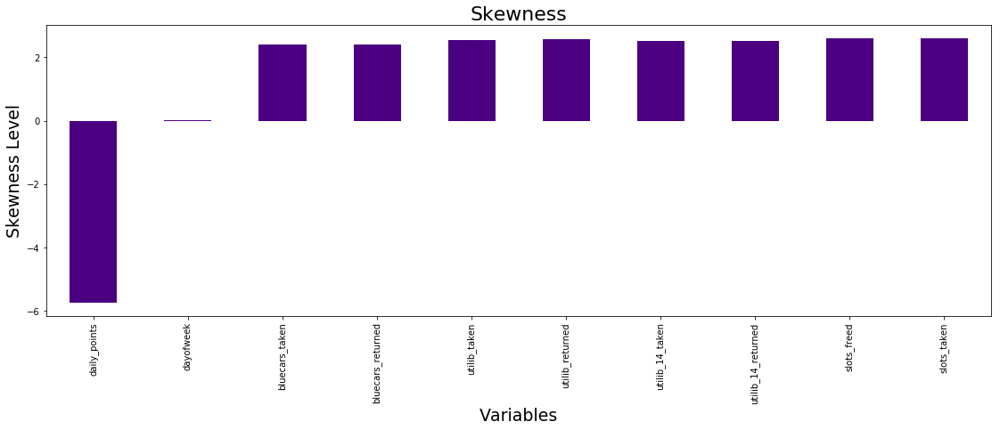

In [0]:
# Calculating Skewness in the columns of our dataset

cols = [col for col in df.columns if col not in ['postal_code']]

df[cols].skew().plot.bar(figsize =(19,6), color = 'indigo')

plt.title('Skewness',fontsize = 22)

plt.xlabel('Variables', fontsize = 19)

plt.ylabel('Skewness Level', fontsize = 19)

plt.show()

- OBSERVATION: 
>              1.The daily points column had negative skewness thus skewed to the left
>              2.The day of the week column did not have any skew
>              3.The rest of the columns had positive skewness 

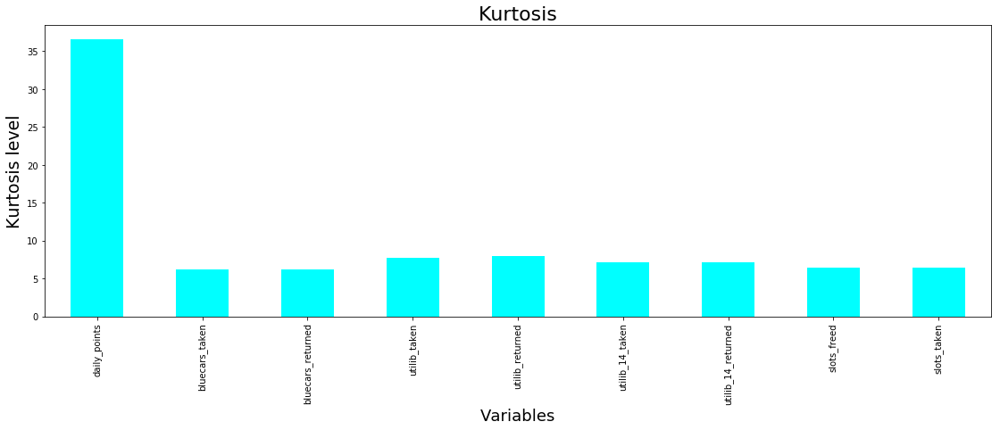

In [0]:
# Measuring kurtosis

cols = [col for col in df.columns if col not in ['postal_code','dayofweek']]

df[cols].kurt().plot.bar(figsize =(19,6),color = 'cyan')

plt.title('Kurtosis',fontsize = 22)

plt.ylabel('Kurtosis level',fontsize = 19)

plt.xlabel('Variables',fontsize = 18)

plt.show()

-  OBSERVATION: All significant columns have positive kurtosis thus leptokurtic

### b. Bivariate Analysis

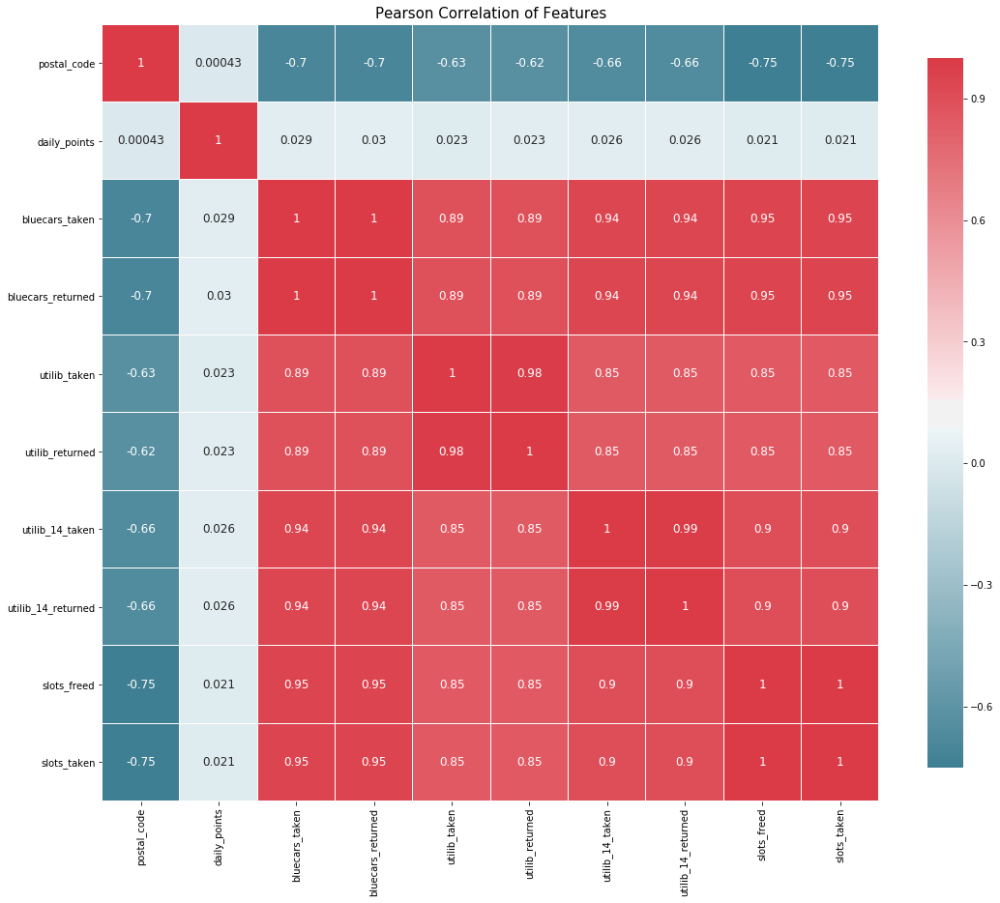

In [0]:
# Ploting the bivariate summaries and recording our observations
#
# correlation heatmap of dataset

def correlation_heatmap(df):
  
    _ , ax = plt.subplots(figsize =(18, 15))
    
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    _ = sns.heatmap(
        
        df.corr(), 
        
        cmap = colormap,
        
        square=True, 
        
        cbar_kws={'shrink':.9 }, 
        
        ax=ax,
        
        annot=True, 
        
        linewidths=0.1,vmax=1.0, linecolor='white',
        
        annot_kws={'fontsize':12 }
    )
    
    plt.title('Pearson Correlation of Features', y=1.05, size=15)

correlation_heatmap(df)

- OBSERVATION: Bluecars_taken, blucars_returned ,slots freed and slots taken have the highest correlation.

<Figure size 1008x1008 with 0 Axes>

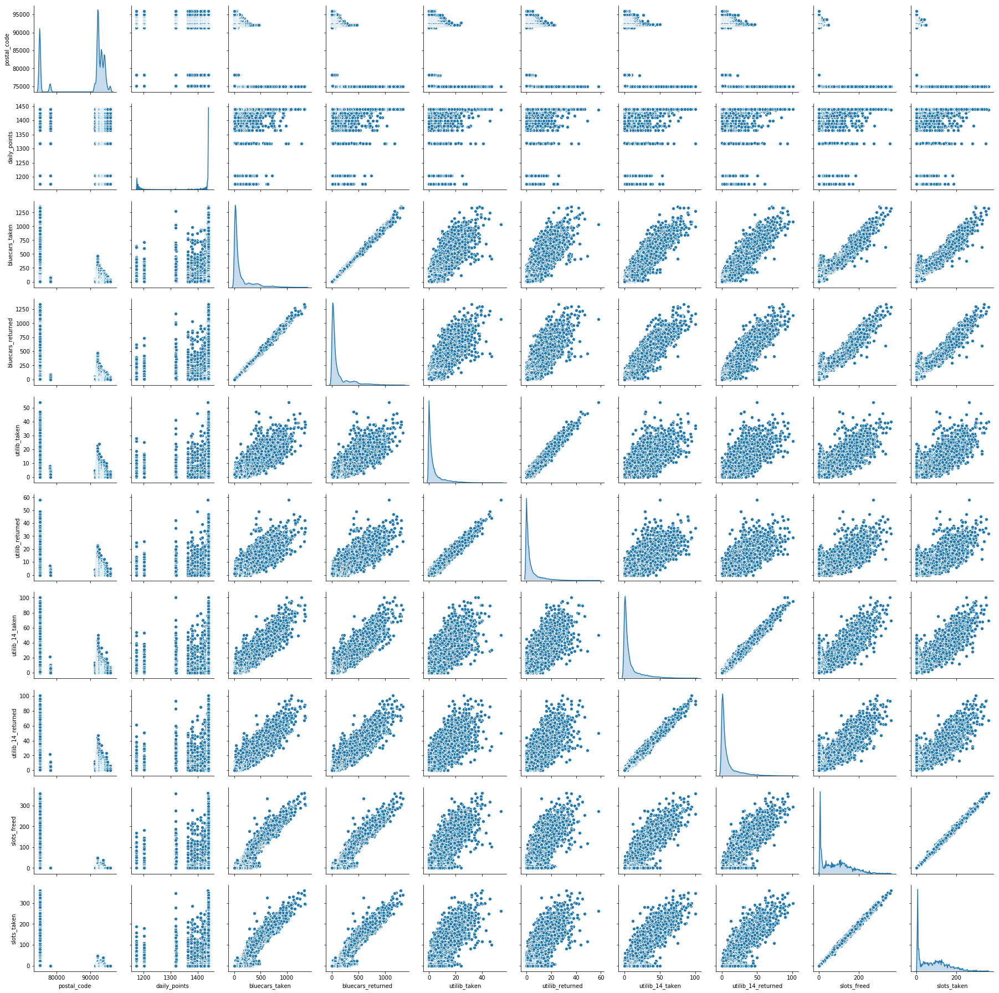

In [38]:
# Crossplots distribution

plt.figure(figsize=(14, 14))




sns.pairplot(df, diag_kind='kde');

plt.show()

### c. Time Analysis

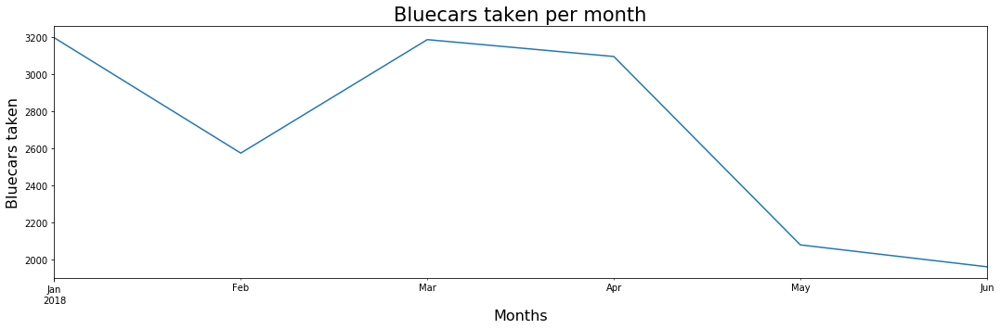

In [37]:
# Representation of Bluecars taken in monthly samples 

df.bluecars_taken.resample('M').count().plot(figsize =(18,5))

plt.xlabel('Months', fontsize = 16)

plt.ylabel('Bluecars taken',fontsize = 16)

plt.title('Bluecars taken per month',fontsize = 21)

plt.show()

- OBSERVATION: There was supression the number of blue cars returned in the beginning of February and a depreciation beginning May

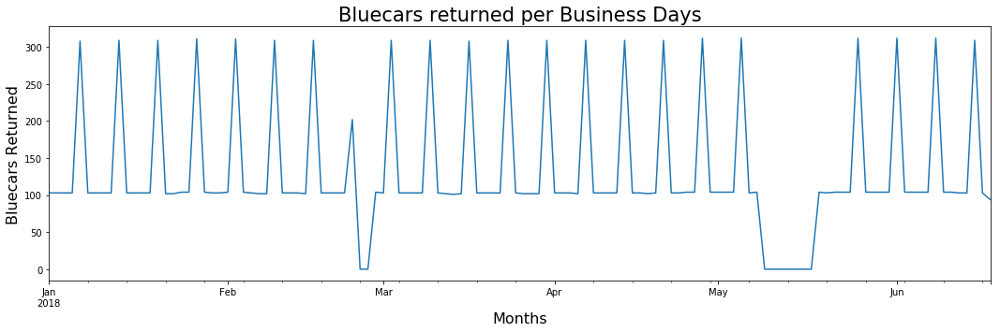

In [39]:
# Representation of Bluecars returned in Business Days 

df.bluecars_returned.resample('B').count().plot(figsize =(18,5))

plt.xlabel('Months', fontsize = 16)

plt.ylabel('Bluecars Returned',fontsize = 16)

plt.title('Bluecars returned per Business Days',fontsize = 21)

plt.show()

- OBSERVATION:
> 1. There was a depreciation in bluecars returned towards the end of the month of February and May
> 2. Bluecar returns spike during the weekends

### d. Multivariate Analysis

In [0]:
# Loading data

df = pd.read_csv('http://bit.ly/DSCoreAutolibDataset')

In [0]:
# Separating columns for dimension reduction

cols = [col for col in df.columns if col not in['dayOfWeek','date','day_type','day_type']] 

df1 = df[cols]

#### Normalisation & P.C.A

In [0]:
# Normalizing the data

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

df1 = sc.fit_transform(df1)

sc.
  

In [162]:
# Applying PCA

from sklearn.decomposition import PCA
  
pca = PCA()
  
df  = pca.fit_transform(df1)
  
pca.explained_variance_
  

array([7.91741841e+00, 1.00024533e+00, 5.04823858e-01, 3.11725318e-01,
       1.69003820e-01, 6.93397447e-02, 1.80479902e-02, 7.96166658e-03,
       1.61495377e-03, 4.40637101e-04])

## Sampling 

In [0]:
# Importing csv with date column as index for timewise analysis

df = pd.read_csv('autolib.csv', parse_dates = ['date'],index_col = 'date')

# Dropping former index column:
df.drop('Unnamed: 0',axis =1,inplace = True)

# Previewing data:
df.head(3)

#### Creating Extra Columns for Further Time Analysis

> In order to determine whether cars hired in the beginning of the weekend were returned during the same weekend, 

> we shall use data of cars hired over night.

> To acquire this data we shall need two extra columns:

- 1. A Column that indicates cars hired as the weekend begun but were not returned on the same day

- 2. Another Column indicating cars that were returned during the weekend but were not among cars available in the postal code that day.

> We can then compare these two columns to acquire insights about our research question.

#### Getting Dummies for Categorical columns

In [40]:
# Our dataset has variables whose values are in text format.

# For such values to be represented accurately in our analysis plots we shall asign them numeric representatives


dummy = pd.get_dummies(df[['dayofweek']])

dummy.head(2)

,dayofweek_Friday,dayofweek_Monday,dayofweek_Saturday,dayofweek_Sunday,dayofweek_Thursday,dayofweek_Tuesday,dayofweek_Wednesday
date,,,,,,,
2018-01-01,0,1,0,0,0,0,0
2018-01-02,0,0,0,0,0,1,0


In [0]:
# We shall then merge dummy values to our dataframe

df = pd.concat([df,dummy],axis = 1)

In [72]:
# Here we calculate the number of cars hired but were not returned on Friday

# To get this we shall first separate weekend data from the rest of the days

weekend = df[['dayofweek_Friday','dayofweek_Saturday','dayofweek_Sunday','bluecars_taken','bluecars_returned']]  

df = pd.DataFrame(weekend)

friday = df.loc[df['dayofweek_Friday'] == 1]

friday = pd.DataFrame(friday)

friday.to_csv('friday.csv')

friday = pd.read_csv('friday.csv', index_col = None)

saturday = df.loc[df['dayofweek_Saturday'] == 1]

saturday = pd.DataFrame(saturday)

saturday.to_csv('saturday.csv')

saturday = pd.read_csv('saturday.csv', index_col = None)

sunday = df.loc[df['dayofweek_Sunday'] == 1]

sunday =pd.DataFrame(sunday)

sunday.to_csv('sunday.csv')

sunday = pd.read_csv('sunday.csv', index_col = None)

# Getting the average of cars not returned in the beginning of the weekend: 
# 
#  . Cars taken less(-) cars returned divided(/) by total days gives us average number cars not returned

friday['bluecars_out'] = (friday.bluecars_taken - friday.bluecars_returned)

print('Average number of extra Cars not returned: ',friday.bluecars_out.mean())

print('\n')

friday.head(3)

Average outside Cars not returned:  1.108322324966975




,dayofweek_Friday,dayofweek_Saturday,dayofweek_Sunday,bluecars_taken,bluecars_returned,bluecars_out
date,,,,,,
2018-01-05,1,0,0,114,117,-3
2018-01-12,1,0,0,126,127,-1
2018-01-19,1,0,0,130,130,0


In [143]:
# Here we shall get the average of cars returned on saturday but were not among cars available in the postal code that day
#
# To get this we shall first separate Saturday data from the rest of the days

print('bluecars returned column: ',saturday.bluecars_returned.head())

x = pd.DataFrame(saturday.bluecars_returned - friday.bluecars_returned)

print('\n')

print('average number of extra cars returned: ',x.mean())

bluecars returned column:  0    185
1    223
2    217
3    218
4    204
Name: bluecars_returned, dtype: int64


average of outside cars returned:  bluecars_returned    28.928099
dtype: float64


In [76]:
# Here we calculate the average number of cars hired but were not returned on Saturday


# Getting the average of cars not returned on Saturday: 
# 
#  . Cars taken less(-) cars returned divided(/) by total days gives us average number cars not returned

saturday['bluecars_out'] = (saturday.bluecars_taken - saturday.bluecars_returned)

print('Average number of extra Cars not returned: ',saturday.bluecars_out.mean())

print('\n')

saturday.head(3)

Average outside Cars not returned:  1.042787825319806




,dayofweek_Friday,dayofweek_Saturday,dayofweek_Sunday,bluecars_taken,bluecars_returned,bluecars_out
date,,,,,,
2018-01-06,0,1,0,187,185,2
2018-01-13,0,1,0,224,223,1
2018-01-20,0,1,0,217,217,0


In [146]:
# Here we shall get the average of cars returned at the end of the weekend(Sunday) but were not among cars available in the postal code that day
#
# Getting the average of cars returned at the end of the weekend: 

x = pd.DataFrame(sunday.bluecars_returned - saturday.bluecars_returned)

print('\n')

print('average number of extra cars returned: ',x.mean())

print('\n')

sunday.head()



average of outside cars returned:  bluecars_returned   -5.723864
dtype: float64




,date,dayofweek_Friday,dayofweek_Saturday,dayofweek_Sunday,bluecars_taken,bluecars_returned
0,2018-01-07,0,0,1,180,180
1,2018-01-14,0,0,1,193,193
2,2018-01-21,0,0,1,143,150
3,2018-01-28,0,0,1,190,189
4,2018-02-04,0,0,1,186,180


In [157]:
df1.columns

Index(['Postal code', 'n_daily_data_points', 'BlueCars_taken_sum',
       'BlueCars_returned_sum', 'Utilib_taken_sum', 'Utilib_returned_sum',
       'Utilib_14_taken_sum', 'Utilib_14_returned_sum', 'Slots_freed_sum',
       'Slots_taken_sum'],
      dtype='object')

## 6. Implementing the Solution

In [172]:
#predicting with xgboost

y = df['dayOfWeek']
model = XGBClassifier(learning_rate=0.1,  n_estimators=100,    max_depth = 4,  subsample = 0.8, min_child_weight = 3)
model.fit(df1,y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=3, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.8, verbosity=1)

In [174]:
print(model.feature_importances_)

[0.10274865 0.4216881  0.09080366 0.0844398  0.04066116 0.04685195
 0.04659951 0.04847356 0.05996636 0.05776725]


In [178]:
importances = pd.DataFrame({'feature':df1.columns,'importance':np.round(model.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances

,importance
feature,
n_daily_data_points,0.422
Postal code,0.103
BlueCars_taken_sum,0.091
BlueCars_returned_sum,0.084
Slots_freed_sum,0.060
Slots_taken_sum,0.058
Utilib_14_returned_sum,0.048
Utilib_returned_sum,0.047
Utilib_14_taken_sum,0.047


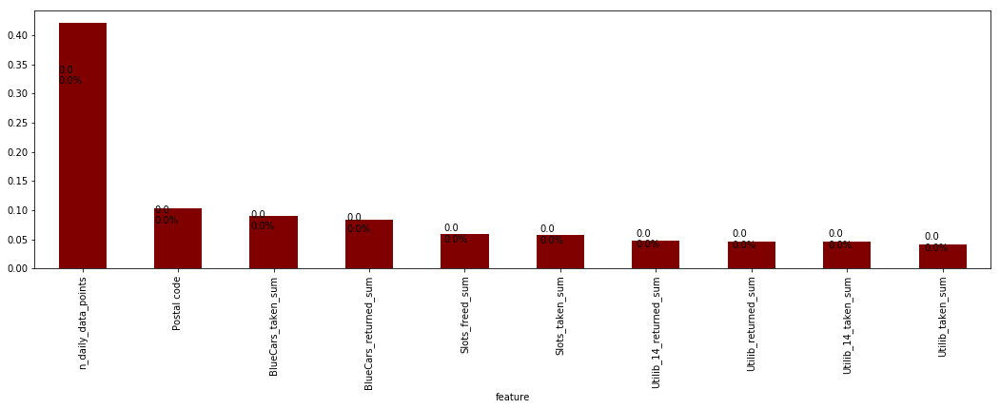

In [202]:
# Plotting Feature importances

x = importances.groupby(['feature'])['importance'].sum().copy()

ax = x.sort_values(ascending=False).plot(kind='bar', figsize=(18, 5),color = 'maROON');

for p in ax.patches:
  
    ax.annotate(str( round( p.get_height() ) ) + "\n" + str(round( p.get_height() /89.170) )+ "%", 
                
                (p.get_x() * 1.007, p.get_height() * 0.75),
                
                color='black')


## Hypothesis Testing

> I tested whether cars hired throughout weekends are returned during the weekends. 

> The mean for the number of extra cars not returned during the beginning of the weekend was:1.042787825319806

>The mean for the number of extra cars returned during the end of the weekdays was:1.108322324966975

> The mean for the number of extra cars returned during the middle of the weekend was :28.928099

> The mean for the number of extra cars returned during the end of the weekend was:-5.723864

>OBSERVATION: 
-The number of cars hired during weekdays are not all returned by the end of the weekday,

-The number of cars hired during the beginning of the weekend are less than the cars returned by the end of the weekend

-Comparing this it was evident that cars hired by the end of the week are returned during the weekend but those hired during the

-weekend are not returned during the weekend



In [207]:
# imporing the shapiro function

from scipy.stats import shapiro 

# generating univariate observations

data = df.BlueCars_taken_sum

# testing for normality
stat, p = shapiro(data)
print('Statistics=%.3f, p=%.3f' % (stat, p))

# interpreting
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian')
else:
	print('Sample does not look Gaussian')

Statistics=0.661, p=0.000
Sample does not look Gaussian


/usr/local/lib/python3.6/dist-packages/scipy/stats/morestats.py:1660: UserWarning:

p-value may not be accurate for N > 5000.



## 8. Follow up questions

### a). Did we have the right data?

> Yes, the data was adequate for the research question 

### b). Do we need other data to answer our question?

> Yes, making predictions using models proved a challenge due to limiting data

### c). Did we have the right question?

> Yes, The research question was set in accordance to the data at hand thus relevant

## Conclusion

> From the analysis it is clear that bluecars hired out during the weekends are not returned during the weekend.
> I also noticed an increase in cars returned on Saturdays followed by a decrease on Sundays across the six months